# Metadata

```yaml
course:   DS 5001 
module:   Final Project
topic:    Exploratory Text Analytics using Television Sitcom Scripts Final Report
author:   Eric Tria
date:     2 May 2023
```

# Student Info

```yaml
name:     Eric Tria
user_id:  emt4wf
email:    emt4wf@virginia.edu
```

# Project: Exploratory Text Analytics using Television Sitcom Scripts

## 1. Introduction
Describe the nature of your corpus and the question(s) you've asked of the data.

## 2. Source Data
Provide a description of all relativant source files and describe the following features for each source file:

### 2.1 Provenance
Where did they come from? Describe the website or other source and provide relevant URLs.

### 2.2 Location
Provide a link to the source files in UVA Box.

### 2.3 Description
What is the general subject matter of the corpus? How many observations are there? What is the average document length?

### 2.4 Format
A description of both the file formats of the source files, e.g., plaintext, XML, CSV, etc., and the internal structure where applicable. For - example, if XML then specify document type (e.g., TEI or XHTML).

## 3. Data Model
Describe the analytical tables you generated in the process of tokenization, annotation, and analysis of your corpus. You provide a list of tables with field names and their definition, along with URLs to each associated CSV file.

## 4. Exploration
Describe each of your explorations, such as PCA and topic models. For each, include the relevant parameters and hyperparemeters used to generate each model and visualization. For your visualizations, you should use at least three (but likely more) of the following visualization types:

#### 4.1 Hierarchical cluster diagrams
The first thing we will check is if the seasons between the 3 series are related with one another.

In [1]:
import numpy as np
import pandas as pd

from lib.corpus_enhancer import CorpusEnhancer

from numpy.linalg import norm
from scipy.spatial.distance import pdist

import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA
import nltk

import seaborn as sns; sns.set(style='ticks')

import pandas as pd
import numpy as np
from gensim.models import word2vec
from sklearn.manifold import TSNE
import plotly_express as px

In [3]:
final_dir = 'final/'
series_prefixes = ['PNR', 'B99', 'OFFICE']

OHCO = ['series_id', 'season_id', 'episode_id', 'scene_id', 'line_id', 'token_id']
TOKENS = OHCO[:6]
LINES = OHCO[:5]
SCENES = OHCO[:4]
EPISODES = OHCO[:3]
SEASONS = OHCO[:2]
SERIES = OHCO[:1]

colors = 'YlGnBu'

In [3]:
corpora = []
for sp in series_prefixes:
    corpora.append(pd.read_csv('{0}{1}-CORPUS.csv'.format(final_dir, sp)))

CORPUS = pd.concat(corpora)
CORPUS.to_csv(final_dir + 'ALL-CORPUS.csv')

In [4]:
CORPUS = pd.read_csv(final_dir + 'ALL-CORPUS.csv')

In [5]:
CORPUS = CORPUS.set_index(SCENES).drop(list(set(OHCO) - set(SCENES)), axis = 1)
CORPUS

Unnamed: 0         pos_tuple   pos  \
series_id   season_id episode_id scene_id                                       
parksandrec 1         1          1                  0  ('Hello.', 'NN')    NN   
                                 1                  1     ('Hi.', 'NN')    NN   
                                 1                  2    ('My', 'PRP$')  PRP$   
                                 1                  3    ('name', 'NN')    NN   
                                 1                  4     ('is', 'VBZ')   VBZ   
...                                               ...               ...   ...   
theoffice   9         23         15            564623    ('that', 'IN')    IN   
                                 15            564624    ('kind', 'NN')    NN   
                                 15            564625      ('of', 'IN')    IN   
                                 15            564626     ('the', 'DT')    DT   
                                 15            564627  ('point?', 'NN')    NN   

                                          token_str term_str  
series_id   season_id episode_id scene_id                     
parksandrec 1         1          1           Hello.    hello  
                                 1              Hi.       hi  
                                 1               My       my  
                                 1             name     name  
                                 1               is       is  
...                                             ...      ...  
theoffice   9         23         15            that     that  
                                 15            kind     kind  
                                 15              of       of  
                                 15             the      the  
                                 15          point?    point  

[1563801 rows x 5 columns]

In [5]:
ce = CorpusEnhancer(CORPUS, SCENES)

In [ ]:
VOCAB = ce.generate_enhanced_vocab(SCENES)

Using TF method: sum


In [7]:
VOCAB

,n,n_chars,p,i,h,max_pos,n_pos,cat_pos,stop,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max,dfidf
term_str,,,,,,,,,,,,,,
0,17,1,1.087610e-05,16.488480,0.000179,CD,2,"{CD, NN}",0,0.001519,0.022779,0.001325,0.003502,73.603359
00,1,2,6.397703e-07,20.575943,0.000013,CD,1,{CD},0,0.002166,0.002166,0.002166,0.002166,8.813781
000003,1,6,6.397703e-07,20.575943,0.000013,NN,1,{NN},0,0.002497,0.002497,0.002497,0.002497,8.813781
000007044,1,9,6.397703e-07,20.575943,0.000013,CD,1,{CD},0,0.002036,0.002036,0.002036,0.002036,8.813781
001834310,1,9,6.397703e-07,20.575943,0.000013,CD,1,{CD},0,0.001975,0.001975,0.001975,0.001975,8.813781
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ühumming,1,8,6.397703e-07,20.575943,0.000013,NN,1,{NN},0,0.003122,0.003122,0.003122,0.003122,8.813781
ümusical,4,8,2.559081e-06,18.575943,0.000048,NN,1,{NN},0,0.012489,0.012489,0.012489,0.012489,8.813781
ünew,1,4,6.397703e-07,20.575943,0.000013,NN,1,{NN},0,0.002973,0.002973,0.002973,0.002973,8.813781


In [8]:
libs = []
for sp in series_prefixes:
    libs.append(pd.read_csv('{0}{1}-LIB.csv'.format(final_dir, sp)))

LIB = pd.concat(libs)
LIB['series_season'] = LIB.apply(lambda x: '{0} Season {1}'.format(x['series_name'], x['season_id']), axis = 1)
LIB = LIB.set_index(SEASONS)
LIB

num_episodes  year  viewers_millions  rt_rating  \
series_id   season_id                                                    
parksandrec 1                     6  2009              6.00         68   
            2                    24  2010              4.60         96   
            3                    16  2011              5.10        100   
            4                    22  2012              4.40        100   
            5                    22  2013              4.06         96   
            6                    22  2014              3.76         96   
            7                    13  2015              4.57         89   
brooklyn99  1                    22  2014              4.80         89   
            2                    23  2015              4.87        100   
            3                    23  2016              3.98         93   
            4                    22  2017              2.87        100   
            5                    22  2018              2.71        100   
            6                    18  2019              3.11        100   
            7                    13  2020              2.69         89   
            8                    10  2021              1.69         89   
theoffice   1                     6  2005              5.40         69   
            2                    22  2006              8.00        100   
            3                    25  2007              8.30        100   
            4                    19  2008              8.04         83   
            5                    28  2009              9.04        100   
            6                    26  2010              8.73         73   
            7                    26  2011              7.73         83   
            8                    24  2012              6.51         44   
            9                    25  2013              5.06         79   

                                series_name                  series_season  
series_id   season_id                                                       
parksandrec 1          Parks and Recreation  Parks and Recreation Season 1  
            2          Parks and Recreation  Parks and Recreation Season 2  
            3          Parks and Recreation  Parks and Recreation Season 3  
            4          Parks and Recreation  Parks and Recreation Season 4  
            5          Parks and Recreation  Parks and Recreation Season 5  
            6          Parks and Recreation  Parks and Recreation Season 6  
            7          Parks and Recreation  Parks and Recreation Season 7  
brooklyn99  1            Brooklyn Nine-Nine    Brooklyn Nine-Nine Season 1  
            2            Brooklyn Nine-Nine    Brooklyn Nine-Nine Season 2  
            3            Brooklyn Nine-Nine    Brooklyn Nine-Nine Season 3  
            4            Brooklyn Nine-Nine    Brooklyn Nine-Nine Season 4  
            5            Brooklyn Nine-Nine    Brooklyn Nine-Nine Season 5  
            6            Brooklyn Nine-Nine    Brooklyn Nine-Nine Season 6  
            7            Brooklyn Nine-Nine    Brooklyn Nine-Nine Season 7  
            8            Brooklyn Nine-Nine    Brooklyn Nine-Nine Season 8  
theoffice   1                    The Office            The Office Season 1  
            2                    The Office            The Office Season 2  
            3                    The Office            The Office Season 3  
            4                    The Office            The Office Season 4  
            5                    The Office            The Office Season 5  
            6                    The Office            The Office Season 6  
            7                    The Office            The Office Season 7  
            8                    The Office            The Office Season 8  
            9                    The Office            The Office Season 9

In [9]:
LIB.to_csv(final_dir + 'ALL-LIB.csv')

In [6]:
LIB = pd.read_csv(final_dir + 'ALL-LIB.csv').set_index(SEASONS)

In [15]:
libs_ep = []
for sp in series_prefixes:
    libs_ep.append(pd.read_csv('{0}{1}-LIB-EPS.csv'.format(final_dir, sp)))

LIB_EPS = pd.concat(libs_ep)
LIB_EPS['series_season_ep'] = LIB_EPS.apply(lambda x: '{0} S0{1} E{2}'.format(x['series_id'], x['season_id'], x['episode_id']), axis = 1)
LIB_EPS = LIB_EPS.set_index(EPISODES)
LIB_EPS

episode_title              director  \
series_id   season_id episode_id                                           
parksandrec 1         1                      Pilot          Greg Daniels   
                      2                 Canvassing           Seth Gordon   
                      3               The Reporter         Jeffrey Blitz   
                      4                 Boys' Club     Michael McCullers   
                      5                The Banquet  Beth McCarthy-Miller   
...                                            ...                   ...   
theoffice   9         21          Livin' the Dream         Jeffrey Blitz   
                      22                  A.A.R.M.          David Rogers   
                      23                  A.A.R.M.          David Rogers   
                      24                    Finale            Ken Kwapis   
                      25                    Finale            Ken Kwapis   

                                          first_writer        date  \
series_id   season_id episode_id                                     
parksandrec 1         1                   Greg Daniels  2009-04-09   
                      2                   Rachel Axler  2009-04-16   
                      3                       Dan Goor  2009-04-23   
                      4                      Alan Yang  2009-04-30   
                      5                  Tucker Cawley  2009-05-07   
...                                                ...         ...   
theoffice   9         21          Niki Schwartz-Wright  2013-05-02   
                      22               Brent Forrester  2013-05-09   
                      23               Brent Forrester  2013-05-09   
                      24                  Greg Daniels  2013-05-16   
                      25                  Greg Daniels  2013-05-16   

                                  us_viewers    series_season_ep  
series_id   season_id episode_id                                  
parksandrec 1         1                 6.77  parksandrec S01 E1  
                      2                 5.92  parksandrec S01 E2  
                      3                 5.24  parksandrec S01 E3  
                      4                 5.29  parksandrec S01 E4  
                      5                 4.64  parksandrec S01 E5  
...                                      ...                 ...  
theoffice   9         21                3.51   theoffice S09 E21  
                      22                4.56   theoffice S09 E22  
                      23                4.56   theoffice S09 E23  
                      24                5.69   theoffice S09 E24  
                      25                5.69   theoffice S09 E25  

[479 rows x 6 columns]

In [16]:
LIB_EPS.to_csv(final_dir + 'ALL-LIB-EPS.csv')

Reduce the number of features in the returned TFIDF matrix to the 1000 most significant terms, using DFIDF as your significance measure and only using terms whose maximum part-of-speech belongs to this set: `NN NNS VB VBD VBG VBN VBP VBZ JJ JJR JJS RB RBR RBS`. Note, these are all open categories, excluding proper nounns.

In [9]:
max_pos_set = ['NN', 'NNS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ', 'JJ', 'JJR', 'RB', 'RBR', 'RBS']
VOCAB_SIG = VOCAB.copy()
VOCAB_SIG = VOCAB_SIG[VOCAB_SIG['max_pos'].isin(max_pos_set)]
VOCAB_SIG = VOCAB_SIG.sort_values('dfidf', ascending = False).head(1000)

In [10]:
VOCAB_SIG

,n,n_chars,p,i,h,max_pos,n_pos,cat_pos,stop,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max,dfidf
term_str,,,,,,,,,,,,,,
lady,247,4,0.000158,12.627575,0.001995,NN,2,"{JJ, NN}",0,0.000621,0.103006,0.000452,0.002362,238.831132
clear,253,5,0.000162,12.592949,0.002038,JJ,2,"{JJ, NN}",0,0.000619,0.102788,0.000475,0.003921,238.831132
answer,236,6,0.000151,12.693300,0.001917,NN,2,"{VB, NN}",0,0.000584,0.097014,0.000445,0.001959,238.831132
lose,240,4,0.000154,12.669052,0.001945,VB,4,"{JJ, VB, VBP, NN}",0,0.000603,0.100073,0.000445,0.004540,238.831132
met,242,3,0.000155,12.657079,0.001960,NN,2,"{NNP, NN}",0,0.000605,0.100446,0.000471,0.001747,238.831132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
meat,110,4,0.000070,13.794583,0.000971,NN,1,{NN},0,0.001341,0.085852,0.000882,0.006930,180.081996
tired,89,5,0.000057,14.100209,0.000803,VBN,2,"{VBN, NN}",0,0.001137,0.072737,0.000835,0.005561,180.081996
destroy,84,7,0.000054,14.183625,0.000762,NN,1,{NN},0,0.001061,0.067891,0.000855,0.004072,180.081996


In [11]:
SIG_TERMS = VOCAB_SIG.index.to_list()
TFIDF_STACKED = ce.TFIDF.stack()
TFIDF_SIG = TFIDF_STACKED[TFIDF_STACKED.index.isin(SIG_TERMS, level = 'term_str')]
TFIDF_MATRIX = TFIDF_SIG.unstack()
TFIDF_MATRIX

term_str                             able  absolutely    accept  accident  \
series_id  season_id episode_id                                             
brooklyn99 1         1           0.000000    0.000375  0.000000  0.000000   
                     2           0.000484    0.000000  0.000000  0.000000   
                     3           0.000454    0.000365  0.000750  0.000000   
                     4           0.000000    0.000000  0.000000  0.000000   
                     5           0.000000    0.000000  0.000000  0.000000   
...                                   ...         ...       ...       ...   
theoffice  9         19          0.000541    0.000000  0.000000  0.000935   
                     20          0.000000    0.000497  0.000000  0.000000   
                     21          0.000367    0.000000  0.001210  0.000634   
                     22          0.000000    0.000494  0.000000  0.000000   
                     23          0.000000    0.000000  0.000441  0.000000   

term_str                         according       act    acting    actual  \
series_id  season_id episode_id                                            
brooklyn99 1         1                 0.0  0.000000  0.000000  0.000000   
                     2                 0.0  0.000642  0.000000  0.000000   
                     3                 0.0  0.000000  0.000000  0.000000   
                     4                 0.0  0.001228  0.000000  0.000000   
                     5                 0.0  0.000000  0.000000  0.000000   
...                                    ...       ...       ...       ...   
theoffice  9         19                0.0  0.001435  0.000000  0.000000   
                     20                0.0  0.001640  0.000000  0.000000   
                     21                0.0  0.000486  0.001722  0.000000   
                     22                0.0  0.000000  0.000000  0.000507   
                     23                0.0  0.000355  0.000419  0.000000   

term_str                              add  address  ...  yesterday       yet  \
series_id  season_id episode_id                     ...                        
brooklyn99 1         1           0.000719      0.0  ...   0.000000  0.000000   
                     2           0.000000      0.0  ...   0.000000  0.000000   
                     3           0.000000      0.0  ...   0.000551  0.000266   
                     4           0.000715      0.0  ...   0.000000  0.000271   
                     5           0.000000      0.0  ...   0.000560  0.000000   
...                                   ...      ...  ...        ...       ...   
theoffice  9         19          0.000000      0.0  ...   0.000000  0.000316   
                     20          0.000954      0.0  ...   0.000749  0.000000   
                     21          0.000000      0.0  ...   0.000888  0.000214   
                     22          0.000000      0.0  ...   0.000000  0.000359   
                     23          0.000000      0.0  ...   0.000000  0.000156   

term_str                             york      youd     youll     young  \
series_id  season_id episode_id                                           
brooklyn99 1         1           0.000000  0.000000  0.000227  0.000000   
                     2           0.000000  0.000000  0.000000  0.000000   
                     3           0.000000  0.000300  0.000000  0.000000   
                     4           0.000000  0.000000  0.000225  0.000000   
                     5           0.000000  0.000000  0.000225  0.000000   
...                                   ...       ...       ...       ...   
theoffice  9         19          0.000000  0.000000  0.000000  0.000000   
                     20          0.000000  0.000000  0.000301  0.000000   
                     21          0.000000  0.000000  0.000178  0.000000   
                     22          0.000000  0.000000  0.000448  0.000372   
                     23          0.000696  0.000177  0.000260  0.000

In [12]:
TFIDF_COLLAPSED = TFIDF_MATRIX.groupby(SEASONS).mean()
TFIDF_COLLAPSED

term_str                   able  absolutely    accept  accident  according  \
series_id   season_id                                                        
brooklyn99  1          0.000169    0.000084  0.000143  0.000112   0.000285   
            2          0.000211    0.000124  0.000161  0.000065   0.000132   
            3          0.000123    0.000210  0.000065  0.000304   0.000205   
            4          0.000152    0.000213  0.000063  0.000358   0.000061   
            5          0.000302    0.000272  0.000120  0.000031   0.000121   
            6          0.000405    0.000081  0.000226  0.000179   0.000176   
            7          0.000181    0.000167  0.000208  0.000247   0.000150   
            8          0.000195    0.000247  0.000063  0.000189   0.000466   
parksandrec 1          0.000160    0.000463  0.000137  0.000000   0.000000   
            2          0.000213    0.000154  0.000141  0.000210   0.000072   
            3          0.000323    0.000176  0.000050  0.000000   0.000106   
            4          0.000128    0.000167  0.000247  0.000149   0.000140   
            5          0.000251    0.000181  0.000234  0.000104   0.000207   
            6          0.000289    0.000185  0.000116  0.000112   0.000167   
            7          0.000229    0.000146  0.000279  0.000132   0.000000   
theoffice   1          0.000094    0.000395  0.000000  0.000000   0.000152   
            2          0.000140    0.000156  0.000042  0.000239   0.000048   
            3          0.000062    0.000368  0.000294  0.000106   0.000048   
            4          0.000167    0.000259  0.000139  0.000303   0.000080   
            5          0.000132    0.000197  0.000145  0.000040   0.000039   
            6          0.000372    0.000242  0.000102  0.000059   0.000137   
            7          0.000258    0.000248  0.000259  0.000199   0.000112   
            8          0.000259    0.000207  0.000194  0.000208   0.000043   
            9          0.000076    0.000264  0.000286  0.000111   0.000132   

term_str                    act    acting    actual       add   address  ...  \
series_id   season_id                                                    ...   
brooklyn99  1          0.000198  0.000231  0.000035  0.000233  0.000187  ...   
            2          0.000385  0.000092  0.000130  0.000098  0.000201  ...   
            3          0.000162  0.000189  0.000067  0.000152  0.000529  ...   
            4          0.000126  0.000209  0.000000  0.000259  0.000161  ...   
            5          0.000140  0.000111  0.000236  0.000133  0.000123  ...   
            6          0.000312  0.000579  0.000167  0.000052  0.000058  ...   
            7          0.000311  0.000368  0.000197  0.000193  0.000047  ...   
            8          0.000200  0.000174  0.000256  0.000234  0.000450  ...   
parksandrec 1          0.000000  0.000132  0.000144  0.000000  0.000136  ...   
            2          0.000272  0.000096  0.000177  0.000115  0.000146  ...   
            3          0.000079  0.000191  0.000361  0.000312  0.000108  ...   
            4          0.000131  0.000187  0.000281  0.000126  0.000217  ...   
            5          0.000194  0.000061  0.000201  0.000252  0.000036  ...   
            6          0.000090  0.000238  0.000217  0.000136  0.000414  ...   
            7          0.000317  0.000120  0.000378  0.000082  0.000186  ...   
theoffice   1          0.000133  0.000156  0.000000  0.000314  0.000000  ...   
            2          0.000250  0.000044  0.000224  0.000044  0.000189  ...   
            3          0.000086  0.000559  0.000111  0.000000  0.000107  ...   
            4          0.000056  0.000000  0.000139  0.000129  0.000037  ...   
            5          0.000092  0.000063  0.000036  0.000135  0.000148  ...   
            6          0.000168  0.000137  0.000000  0.000153  0.000069  ...   
            7          0.000250  0.000230  0.000163  0.000195  0.000032  ...   
            8          0.000173  0.000148  0.000033

In [18]:
L0 = TFIDF_COLLAPSED.astype('bool').astype('int') # Binary (Pseudo L)
L1 = TFIDF_COLLAPSED.apply(lambda x: x / x.sum(), 1) # Probabilistic
L2 = TFIDF_COLLAPSED.apply(lambda x: x / norm(x), 1) # Pythagorean / Euclidean

PAIRS = pd.DataFrame(index=pd.MultiIndex.from_product([LIB.index.tolist(), LIB.index.tolist()])).reset_index()
PAIRS = PAIRS[PAIRS.level_0 < PAIRS.level_1].set_index(['level_0','level_1'])
PAIRS.index.names = ['doc_a', 'doc_b']

In [19]:
PAIRS

Empty DataFrame
Columns: []
Index: [((parksandrec, 1), (parksandrec, 2)), ((parksandrec, 1), (parksandrec, 3)), ((parksandrec, 1), (parksandrec, 4)), ((parksandrec, 1), (parksandrec, 5)), ((parksandrec, 1), (parksandrec, 6)), ((parksandrec, 1), (parksandrec, 7)), ((parksandrec, 1), (theoffice, 1)), ((parksandrec, 1), (theoffice, 2)), ((parksandrec, 1), (theoffice, 3)), ((parksandrec, 1), (theoffice, 4)), ((parksandrec, 1), (theoffice, 5)), ((parksandrec, 1), (theoffice, 6)), ((parksandrec, 1), (theoffice, 7)), ((parksandrec, 1), (theoffice, 8)), ((parksandrec, 1), (theoffice, 9)), ((parksandrec, 2), (parksandrec, 3)), ((parksandrec, 2), (parksandrec, 4)), ((parksandrec, 2), (parksandrec, 5)), ((parksandrec, 2), (parksandrec, 6)), ((parksandrec, 2), (parksandrec, 7)), ((parksandrec, 2), (theoffice, 1)), ((parksandrec, 2), (theoffice, 2)), ((parksandrec, 2), (theoffice, 3)), ((parksandrec, 2), (theoffice, 4)), ((parksandrec, 2), (theoffice, 5)), ((parksandrec, 2), (theoffice, 6)), ((parksandrec, 2), (theoffice, 7)), ((parksandrec, 2), (theoffice, 8)), ((parksandrec, 2), (theoffice, 9)), ((parksandrec, 3), (parksandrec, 4)), ((parksandrec, 3), (parksandrec, 5)), ((parksandrec, 3), (parksandrec, 6)), ((parksandrec, 3), (parksandrec, 7)), ((parksandrec, 3), (theoffice, 1)), ((parksandrec, 3), (theoffice, 2)), ((parksandrec, 3), (theoffice, 3)), ((parksandrec, 3), (theoffice, 4)), ((parksandrec, 3), (theoffice, 5)), ((parksandrec, 3), (theoffice, 6)), ((parksandrec, 3), (theoffice, 7)), ((parksandrec, 3), (theoffice, 8)), ((parksandrec, 3), (theoffice, 9)), ((parksandrec, 4), (parksandrec, 5)), ((parksandrec, 4), (parksandrec, 6)), ((parksandrec, 4), (parksandrec, 7)), ((parksandrec, 4), (theoffice, 1)), ((parksandrec, 4), (theoffice, 2)), ((parksandrec, 4), (theoffice, 3)), ((parksandrec, 4), (theoffice, 4)), ((parksandrec, 4), (theoffice, 5)), ((parksandrec, 4), (theoffice, 6)), ((parksandrec, 4), (theoffice, 7)), ((parksandrec, 4), (theoffice, 8)), ((parksandrec, 4), (theoffice, 9)), ((parksandrec, 5), (parksandrec, 6)), ((parksandrec, 5), (parksandrec, 7)), ((parksandrec, 5), (theoffice, 1)), ((parksandrec, 5), (theoffice, 2)), ((parksandrec, 5), (theoffice, 3)), ((parksandrec, 5), (theoffice, 4)), ((parksandrec, 5), (theoffice, 5)), ((parksandrec, 5), (theoffice, 6)), ((parksandrec, 5), (theoffice, 7)), ((parksandrec, 5), (theoffice, 8)), ((parksandrec, 5), (theoffice, 9)), ((parksandrec, 6), (parksandrec, 7)), ((parksandrec, 6), (theoffice, 1)), ((parksandrec, 6), (theoffice, 2)), ((parksandrec, 6), (theoffice, 3)), ((parksandrec, 6), (theoffice, 4)), ((parksandrec, 6), (theoffice, 5)), ((parksandrec, 6), (theoffice, 6)), ((parksandrec, 6), (theoffice, 7)), ((parksandrec, 6), (theoffice, 8)), ((parksandrec, 6), (theoffice, 9)), ((parksandrec, 7), (theoffice, 1)), ((parksandrec, 7), (theoffice, 2)), ((parksandrec, 7), (theoffice, 3)), ((parksandrec, 7), (theoffice, 4)), ((parksandrec, 7), (theoffice, 5)), ((parksandrec, 7), (theoffice, 6)), ((parksandrec, 7), (theoffice, 7)), ((parksandrec, 7), (theoffice, 8)), ((parksandrec, 7), (theoffice, 9)), ((brooklyn99, 1), (parksandrec, 1)), ((brooklyn99, 1), (parksandrec, 2)), ((brooklyn99, 1), (parksandrec, 3)), ((brooklyn99, 1), (parksandrec, 4)), ((brooklyn99, 1), (parksandrec, 5)), ((brooklyn99, 1), (parksandrec, 6)), ((brooklyn99, 1), (parksandrec, 7)), ((brooklyn99, 1), (brooklyn99, 2)), ((brooklyn99, 1), (brooklyn99, 3)), ((brooklyn99, 1), (brooklyn99, 4)), ((brooklyn99, 1), (brooklyn99, 5)), ((brooklyn99, 1), (brooklyn99, 6)), ((brooklyn99, 1), (brooklyn99, 7)), ((brooklyn99, 1), (brooklyn99, 8)), ((brooklyn99, 1), (theoffice, 1)), ((brooklyn99, 1), (theoffice, 2)), ...]

[276 rows x 0 columns]

In [20]:
PAIRS['cityblock'] = pdist(TFIDF_COLLAPSED, 'cityblock')
PAIRS['cosine'] = pdist(TFIDF_COLLAPSED, 'cosine')
PAIRS['euclidean'] = pdist(L2, 'euclidean')
PAIRS['jaccard'] = pdist(L0, 'jaccard')
PAIRS['js'] = pdist(L1, 'jensenshannon')  

In [24]:
PAIRS.head().style.background_gradient(colors)

In [25]:
def hca(sims, linkage_method='complete', color_thresh=.3, figsize=(10, 10)):
    tree = sch.linkage(sims, method=linkage_method)
    labels = LIB.series_season.values ## edit this
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels, 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14)

<Figure size 640x480 with 0 Axes>

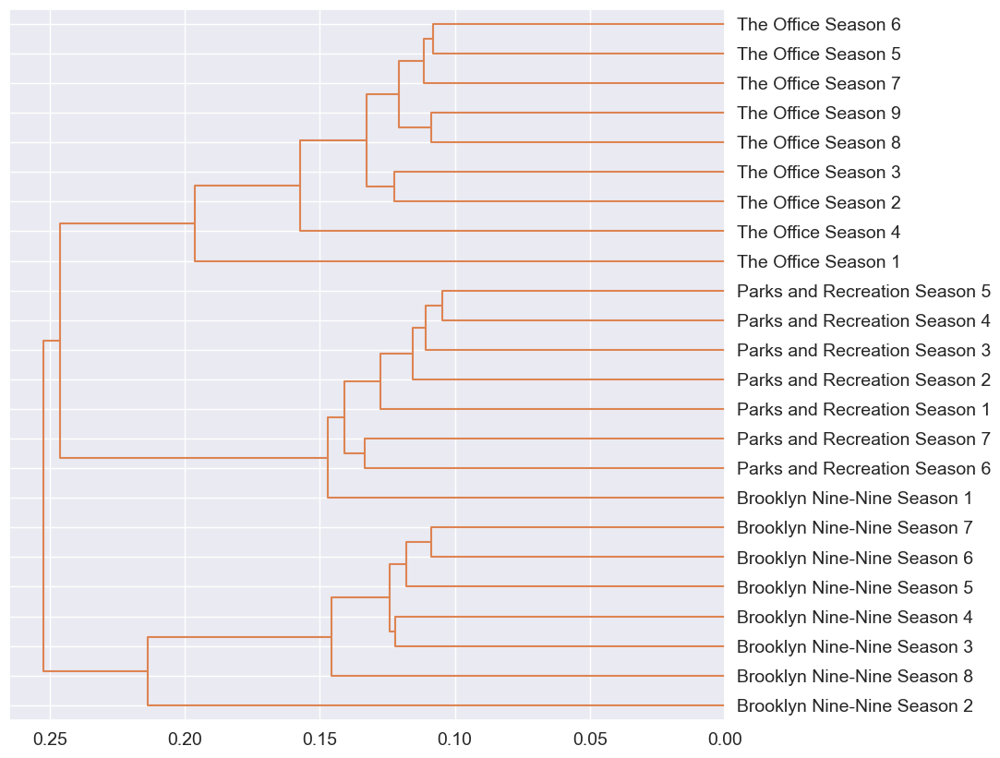

In [26]:
hca(PAIRS.cityblock, linkage_method='weighted', color_thresh=1)

<Figure size 640x480 with 0 Axes>

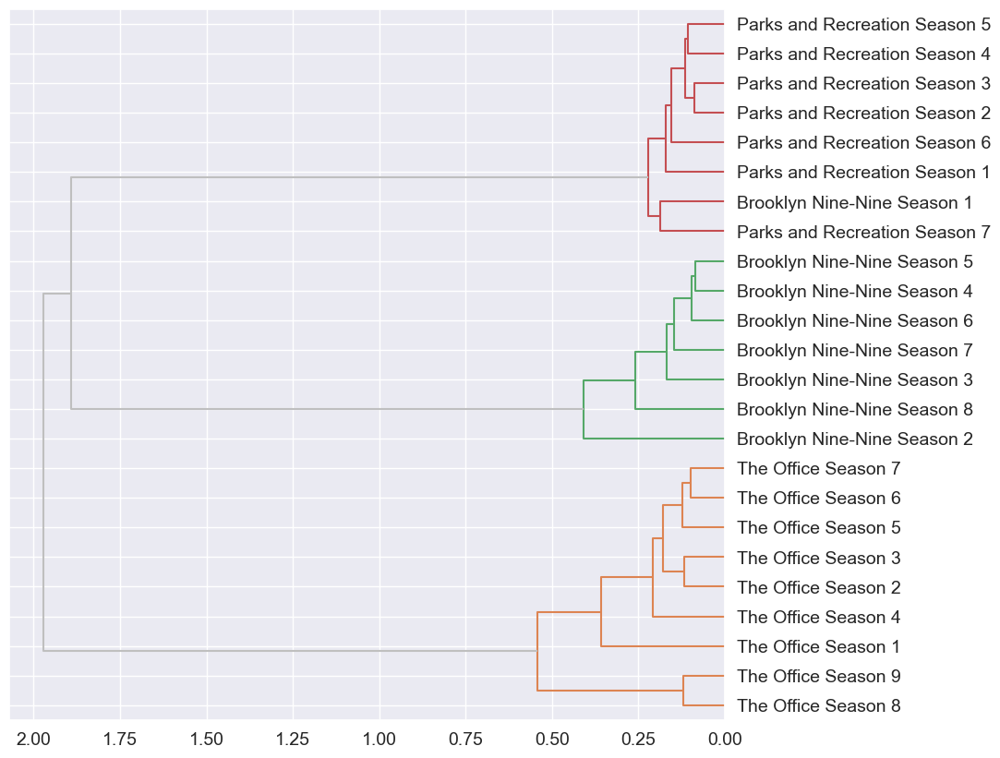

In [27]:
hca(PAIRS.cosine, linkage_method='ward', color_thresh=0.9)

<Figure size 640x480 with 0 Axes>

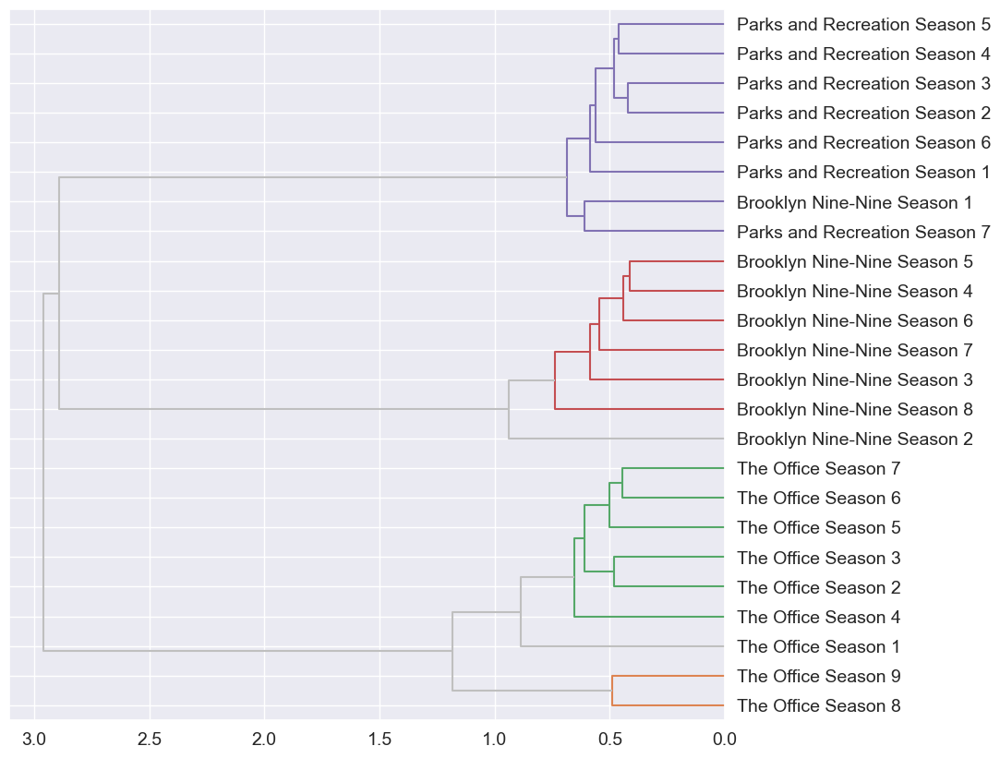

In [28]:
hca(PAIRS.euclidean, linkage_method='ward', color_thresh=0.8)

<Figure size 640x480 with 0 Axes>

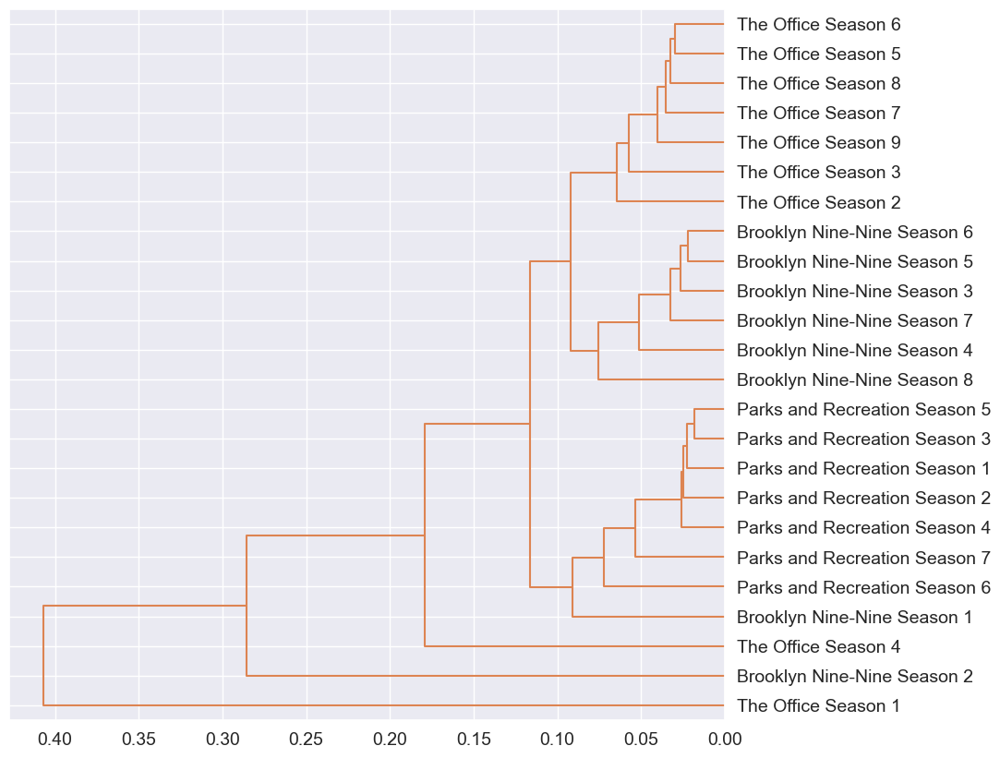

In [29]:
hca(PAIRS.jaccard, linkage_method='weighted', color_thresh=0.7)

<Figure size 640x480 with 0 Axes>

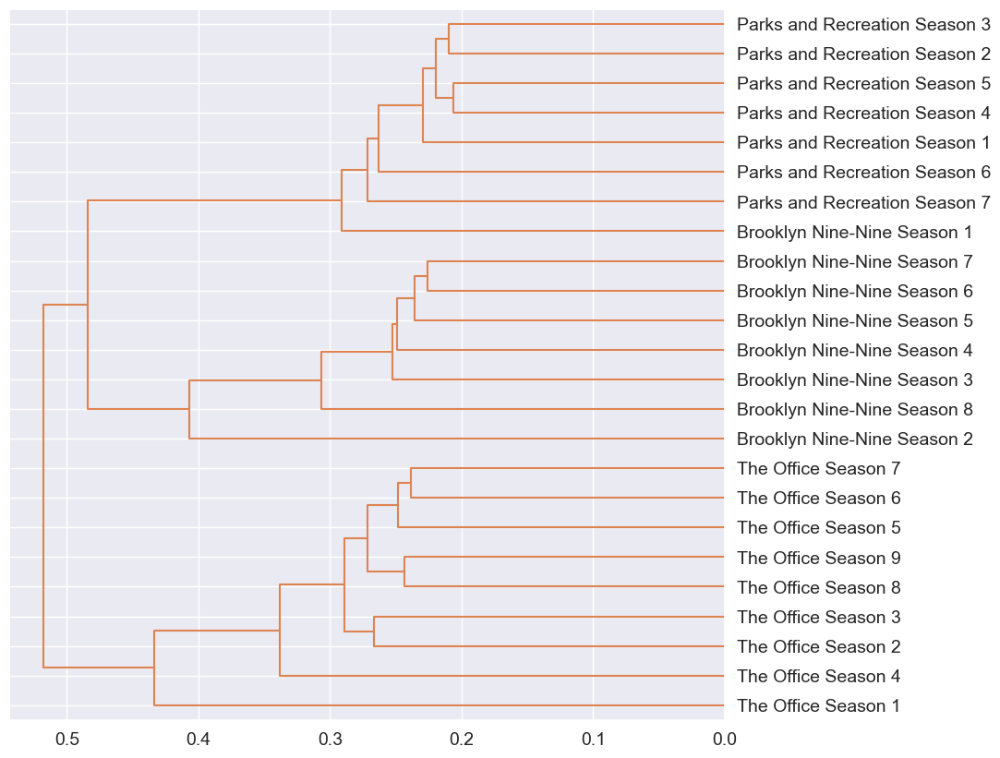

In [30]:
hca(PAIRS.js, linkage_method='weighted', color_thresh=0.6)

#### 4.2 PCA Analysis

In [7]:
from sklearn.decomposition import PCA
from scipy.linalg import norm
from scipy.linalg import eigh
import plotly_express as px
import seaborn as sns
sns.set(style='ticks')

In [8]:
norm_docs = True # This has the effect of exaggerating variance when False
center_term_vectors = True # This has the effect of demoting authorship when False

pca_colors = 'Spectral'

In [9]:
VOCAB = ce.generate_enhanced_vocab(SEASONS, tf_method = 'max')
VOCAB

Using TF method: max


,n,n_chars,p,i,h,max_pos,n_pos,cat_pos,stop,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max,dfidf
term_str,,,,,,,,,,,,,,
0,17,1,1.087610e-05,16.488480,0.000179,CD,2,"{CD, NN}",0,0.000977,0.009768,0.000906,0.001649,12.630344
00,1,2,6.397703e-07,20.575943,0.000013,CD,1,{CD},0,0.001664,0.001664,0.001664,0.001664,4.584963
000003,1,6,6.397703e-07,20.575943,0.000013,NN,1,{NN},0,0.001712,0.001712,0.001712,0.001712,4.584963
000007044,1,9,6.397703e-07,20.575943,0.000013,CD,1,{CD},0,0.002993,0.002993,0.002993,0.002993,4.584963
001834310,1,9,6.397703e-07,20.575943,0.000013,CD,1,{CD},0,0.001664,0.001664,0.001664,0.001664,4.584963
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ühumming,1,8,6.397703e-07,20.575943,0.000013,NN,1,{NN},0,0.001672,0.001672,0.001672,0.001672,4.584963
ümusical,4,8,2.559081e-06,18.575943,0.000048,NN,1,{NN},0,0.006686,0.006686,0.006686,0.006686,4.584963
ünew,1,4,6.397703e-07,20.575943,0.000013,NN,1,{NN},0,0.001672,0.001672,0.001672,0.001672,4.584963


In [10]:
TFIDF = ce.TFIDF
TFIDF

term_str                      0        00    000003  000007044  001834310  \
series_id   season_id                                                       
brooklyn99  1          0.000493  0.000000  0.000000   0.000000   0.000000   
            2          0.000000  0.000000  0.000000   0.000000   0.000000   
            3          0.000488  0.000000  0.000000   0.000000   0.000000   
            4          0.000000  0.001664  0.000000   0.000000   0.001664   
            5          0.000840  0.000000  0.000000   0.000000   0.000000   
            6          0.001649  0.000000  0.000000   0.002993   0.000000   
            7          0.000000  0.000000  0.000000   0.000000   0.000000   
            8          0.000000  0.000000  0.000000   0.000000   0.000000   
parksandrec 1          0.000000  0.000000  0.000000   0.000000   0.000000   
            2          0.000000  0.000000  0.000000   0.000000   0.000000   
            3          0.000000  0.000000  0.000000   0.000000   0.000000   
            4          0.000000  0.000000  0.001712   0.000000   0.000000   
            5          0.000936  0.000000  0.000000   0.000000   0.000000   
            6          0.000000  0.000000  0.000000   0.000000   0.000000   
            7          0.001620  0.000000  0.000000   0.000000   0.000000   
theoffice   1          0.000000  0.000000  0.000000   0.000000   0.000000   
            2          0.000000  0.000000  0.000000   0.000000   0.000000   
            3          0.000000  0.000000  0.000000   0.000000   0.000000   
            4          0.001316  0.000000  0.000000   0.000000   0.000000   
            5          0.000877  0.000000  0.000000   0.000000   0.000000   
            6          0.000417  0.000000  0.000000   0.000000   0.000000   
            7          0.000000  0.000000  0.000000   0.000000   0.000000   
            8          0.001133  0.000000  0.000000   0.000000   0.000000   
            9          0.000000  0.000000  0.000000   0.000000   0.000000   

term_str                  00983        01       019        02     02x16  ...  \
series_id   season_id                                                    ...   
brooklyn99  1          0.000000  0.000000  0.000000  0.001400  0.000000  ...   
            2          0.000000  0.000000  0.000000  0.000000  0.001668  ...   
            3          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            4          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            5          0.000000  0.001191  0.000000  0.000000  0.000000  ...   
            6          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            7          0.000000  0.002012  0.000000  0.000000  0.000000  ...   
            8          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
parksandrec 1          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            2          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            3          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            4          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            5          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            6          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            7          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
theoffice   1          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            2          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            3          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            4          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            5          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            6          0.000000  0.000000  0.000000  0.000000  0.000000  ...   
            7          0.000000  0.000000  0.000000  0.003921  0.000000  ...   
            8          0.002056  0.000000  0.000000  0.000000  0.000000  ... 

In [12]:
DOC = TFIDF.stack().reset_index().rename(columns = {0: 'TFIDF'})
DOC

,series_id,season_id,term_str,TFIDF
0,brooklyn99,1,0,0.000493
1,brooklyn99,1,00,0.000000
2,brooklyn99,1,000003,0.000000
3,brooklyn99,1,000007044,0.000000
4,brooklyn99,1,001834310,0.000000
...,...,...,...,...
784459,theoffice,9,ühumming,0.000000
784460,theoffice,9,ümusical,0.000000
784461,theoffice,9,ünew,0.000000
784462,theoffice,9,üphone,0.000000


In [18]:
DOC = pd.merge(DOC.reset_index(), LIB.reset_index(), on = ['series_id', 'season_id']).set_index(['series_id', 'season_id']).drop(columns = 'index')

In [19]:
DOC

term_str     TFIDF  num_episodes  year  \
series_id  season_id                                            
brooklyn99 1                  0  0.000493            22  2014   
           1                 00  0.000000            22  2014   
           1             000003  0.000000            22  2014   
           1          000007044  0.000000            22  2014   
           1          001834310  0.000000            22  2014   
...                         ...       ...           ...   ...   
theoffice  9           ühumming  0.000000            25  2013   
           9           ümusical  0.000000            25  2013   
           9               ünew  0.000000            25  2013   
           9             üphone  0.000000            25  2013   
           9                  а  0.000000            25  2013   

                      viewers_millions  rt_rating         series_name  \
series_id  season_id                                                    
brooklyn99 1                      4.80         89  Brooklyn Nine-Nine   
           1                      4.80         89  Brooklyn Nine-Nine   
           1                      4.80         89  Brooklyn Nine-Nine   
           1                      4.80         89  Brooklyn Nine-Nine   
           1                      4.80         89  Brooklyn Nine-Nine   
...                                ...        ...                 ...   
theoffice  9                      5.06         79          The Office   
           9                      5.06         79          The Office   
           9                      5.06         79          The Office   
           9                      5.06         79          The Office   
           9                      5.06         79          The Office   

                                    series_season  
series_id  season_id                               
brooklyn99 1          Brooklyn Nine-Nine Season 1  
           1          Brooklyn Nine-Nine Season 1  
           1          Brooklyn Nine-Nine Season 1  
           1          Brooklyn Nine-Nine Season 1  
           1          Brooklyn Nine-Nine Season 1  
...                                           ...  
theoffice  9                  The Office Season 9  
           9                  The Office Season 9  
           9                  The Office Season 9  
           9                  The Office Season 9  
           9                  The Office Season 9  

[784464 rows x 8 columns]

In [20]:
DOC_SUM = DOC.reset_index().groupby(['series_id', 'season_id']).first()[['rt_rating', 'series_name']]

In [21]:
DOC_SUM

rt_rating           series_name
series_id   season_id                                 
brooklyn99  1                 89    Brooklyn Nine-Nine
            2                100    Brooklyn Nine-Nine
            3                 93    Brooklyn Nine-Nine
            4                100    Brooklyn Nine-Nine
            5                100    Brooklyn Nine-Nine
            6                100    Brooklyn Nine-Nine
            7                 89    Brooklyn Nine-Nine
            8                 89    Brooklyn Nine-Nine
parksandrec 1                 68  Parks and Recreation
            2                 96  Parks and Recreation
            3                100  Parks and Recreation
            4                100  Parks and Recreation
            5                 96  Parks and Recreation
            6                 96  Parks and Recreation
            7                 89  Parks and Recreation
theoffice   1                 69            The Office
            2                100            The Office
            3                100            The Office
            4                 83            The Office
            5                100            The Office
            6                 73            The Office
            7                 83            The Office
            8                 44            The Office
            9                 79            The Office

In [23]:
VSHORT = VOCAB[VOCAB.max_pos.isin(['NN', 'NNS'])].sort_values('dfidf', ascending=False).head(1000)
VSHORT

,n,n_chars,p,i,h,max_pos,n_pos,cat_pos,stop,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max,dfidf
term_str,,,,,,,,,,,,,,
risky,16,5,0.000010,16.575943,0.000170,NN,2,"{JJ, NN}",0,0.000912,0.008209,0.000941,0.002055,12.735337
restroom,9,8,0.000006,17.406018,0.000100,NN,1,{NN},0,0.000517,0.004651,0.000515,0.000553,12.735337
hay,37,3,0.000024,15.366489,0.000364,NN,2,"{NN, NNP}",0,0.002294,0.020648,0.001110,0.010833,12.735337
extension,12,9,0.000008,16.990980,0.000130,NN,1,{NN},0,0.000803,0.007229,0.000643,0.001543,12.735337
shapes,22,6,0.000014,16.116511,0.000227,NN,2,"{NNS, NN}",0,0.001306,0.011756,0.000643,0.005981,12.735337
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
destiny,16,7,0.000010,16.575943,0.000170,NN,1,{NN},0,0.000843,0.008429,0.000749,0.001699,12.630344
asap,13,4,0.000008,16.875503,0.000140,NN,1,{NN},0,0.000821,0.008211,0.000570,0.002155,12.630344
robbery,21,7,0.000013,16.183625,0.000217,NN,1,{NN},0,0.001174,0.011744,0.000893,0.002473,12.630344


In [24]:
TFIDF_REDUCED = TFIDF[VSHORT.index]
TFIDF_REDUCED

term_str                  risky  restroom       hay  extension    shapes  \
series_id   season_id                                                      
brooklyn99  1          0.000000  0.000553  0.000000   0.000000  0.000000   
            2          0.001029  0.000515  0.000000   0.000000  0.001029   
            3          0.000000  0.000546  0.000000   0.000000  0.000000   
            4          0.001027  0.000514  0.000000   0.000000  0.000000   
            5          0.000941  0.000000  0.000470   0.000470  0.000470   
            6          0.000000  0.000000  0.000000   0.000000  0.000000   
            7          0.000000  0.000000  0.003176   0.000794  0.000000   
            8          0.000000  0.000000  0.000000   0.000000  0.000971   
parksandrec 1          0.000000  0.000000  0.000000   0.000000  0.000000   
            2          0.000498  0.000498  0.000000   0.000000  0.005981   
            3          0.000000  0.000000  0.001543   0.001543  0.000000   
            4          0.001057  0.000528  0.000000   0.000000  0.000528   
            5          0.000000  0.000000  0.000524   0.000524  0.000000   
            6          0.002055  0.000514  0.001541   0.000514  0.000000   
            7          0.000000  0.000000  0.000000   0.000000  0.000000   
theoffice   1          0.000000  0.000000  0.000000   0.000000  0.000000   
            2          0.000643  0.000000  0.000000   0.000643  0.000643   
            3          0.000000  0.000000  0.000000   0.001242  0.000000   
            4          0.000000  0.000000  0.000000   0.000000  0.000000   
            5          0.000491  0.000000  0.000983   0.000983  0.000983   
            6          0.000467  0.000467  0.000467   0.000000  0.000000   
            7          0.000000  0.000516  0.010833   0.000516  0.000516   
            8          0.000000  0.000000  0.000000   0.000000  0.000635   
            9          0.000000  0.000000  0.001110   0.000000  0.000000   

term_str               demonstrate  explosion       eve      dial    steals  \
series_id   season_id                                                         
brooklyn99  1             0.000000   0.002211  0.000000  0.000000  0.001105   
            2             0.000000   0.000000  0.000515  0.000000  0.000000   
            3             0.000000   0.000000  0.000000  0.000546  0.000000   
            4             0.000514   0.000000  0.000514  0.000000  0.000000   
            5             0.000000   0.000000  0.000000  0.000470  0.000470   
            6             0.000000   0.003695  0.002771  0.000000  0.000000   
            7             0.000000   0.000794  0.000000  0.000794  0.000000   
            8             0.000971   0.000971  0.000000  0.000000  0.000000   
parksandrec 1             0.000000   0.000000  0.000000  0.000000  0.000000   
            2             0.001994   0.000000  0.000000  0.000997  0.000000   
            3             0.000772   0.000772  0.000772  0.000772  0.000772   
            4             0.000000   0.001057  0.000000  0.000000  0.000000   
            5             0.000000   0.000524  0.000524  0.000000  0.001048   
            6             0.000000   0.000000  0.000514  0.000000  0.000000   
            7             0.000908   0.004538  0.000000  0.000000  0.000000   
theoffice   1             0.000000   0.000000  0.000000  0.000000  0.000000   
            2             0.000000   0.000000  0.000643  0.000000  0.000000   
            3             0.001242   0.000000  0.000000  0.000000  0.000000   
            4             0.001474   0.000000  0.000000  0.001474  0.002211   
            5             0.000000   0.000000  0.000491  0.000491  0.000491   
            6             0.000934   0.000000  0.000000  0.000000  0.000000   
            7             0.000000   0.000516  0.000000  0.001032  0.001032   
            8             0.000000   0.000000  0.000635  0.000635  0.000635   
            9             0.001110   0.000000  0

In [36]:
def compute_pca(X, k, norm_docs, center_by_mean, center_by_variance):
    '''
    PURPOSE: compute the PCA from a given document-term count matrix
    
    INPUTS:
    X - The input matrix (dataframe)
    k - The number of components to generate
    norm_docs - Boolean flag to normalize the input matrix
    center_by_mean - Boolean flag to center the input matrix by its mean
    center_by_variance - Boolean flag to center the input matrix by its variance
    
    OUTPUTS:
    LOADINGS - The term-component matrix (dataframe)
    DCM - The document-component matrix (dataframe)
    COMPINS - The component information table (dataframe)
    '''
    if norm_docs:
        X = (X.T / norm(X, 2, axis=1)).T
    
    if center_by_mean:
        X = X - X.mean()
    
    if center_by_variance:
        X = X / X.std()
    
    # Compute Covariance Matrix
    COV = X.T.dot(X) / (X.shape[0] - 1)
    
    # Decompose the Matrix
    eig_vals, eig_vecs = eigh(COV)
    
    # Convert eigen to dataframes
    EIG_VEC = pd.DataFrame(eig_vecs, index=COV.index, columns=COV.index)
    EIG_VAL = pd.DataFrame(eig_vals, index=COV.index, columns=['eig_val'])
    EIG_VAL.index.name = 'term_str'
    
    
    # Select principal components
    # Combine eigenvalues and eigenvectors
    EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)
    
    # Compute explained variance
    EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)
    
    # Pick top K components
    COMPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(k).reset_index(drop=True)
    COMPS.index.name = 'comp_id'
    COMPS.index = ["PC{}".format(i) for i in COMPS.index.tolist()]
    COMPS.index.name = 'pc_id'
    
    # See Projected Components onto Vocabulary (Loadings)
    LOADINGS = COMPS[COV.index].T
    LOADINGS.index.name = 'term_str'
    
    # Project Docs onto Components
    DCM = X.dot(COMPS[COV.index].T) 
    DCM_DOC = pd.merge(DCM, DOC_SUM, left_index = True, right_index = True)
    DCM_DOC['doc'] = DCM_DOC.apply(lambda x: "{0}: {1}".format(
        x.series_name, 
        x.name[1] #season_id
    ), axis = 1)
    
    return LOADINGS, DCM_DOC, COMPS

In [37]:
LOADINGS, DCM, COMPS = compute_pca(
    X = TFIDF_REDUCED,
    k = 10,
    norm_docs = True,
    center_by_mean = False,
    center_by_variance = False
)
LOADINGS

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_str,,,,,,,,,,
risky,-0.002156,-0.002375,-0.003118,-0.001699,0.000492,-0.000410,-0.006793,-0.009445,0.010862,0.002534
restroom,-0.001583,-0.001495,-0.001182,-0.004656,-0.003747,0.002011,-0.009051,-0.004685,0.005851,0.000729
hay,-0.017623,-0.001506,-0.002375,-0.060937,0.021101,-0.001364,-0.013614,0.000336,-0.095071,0.123361
extension,-0.003602,-0.000847,-0.002150,0.004973,0.007193,0.000240,-0.000373,-0.001519,-0.000690,0.026992
shapes,-0.003326,-0.001763,-0.005332,-0.007687,-0.021351,-0.023710,-0.003118,0.001919,-0.017238,0.011673
...,...,...,...,...,...,...,...,...,...,...
destiny,-0.003452,-0.002936,-0.000370,-0.000474,-0.000922,-0.004773,-0.004225,-0.006696,-0.015379,0.004317
asap,-0.007356,0.000272,0.000021,-0.001204,-0.001313,-0.002110,0.003458,-0.002112,0.008480,-0.039543
robbery,-0.001750,-0.007779,0.000676,-0.003131,-0.001336,0.001698,-0.000825,0.007322,-0.008343,0.003827


In [38]:
DCM

PC0       PC1       PC2       PC3       PC4  \
series_id   season_id                                                     
brooklyn99  1         -0.080456 -0.904931  0.064877  0.007057 -0.303095   
            2         -0.086371 -0.966757  0.070771  0.002915 -0.048631   
            3         -0.088374 -0.965984  0.067857  0.003702  0.038381   
            4         -0.088168 -0.970500  0.068961  0.000395 -0.046533   
            5         -0.087107 -0.953112  0.066754 -0.000731  0.103850   
            6         -0.084441 -0.941551  0.065550 -0.000074  0.138241   
            7         -0.086481 -0.952471  0.062144 -0.006878  0.164303   
            8         -0.083113 -0.923754  0.064892 -0.003713 -0.062634   
parksandrec 1         -0.049998 -0.065764 -0.934064 -0.021170 -0.210724   
            2         -0.055893 -0.069378 -0.956448 -0.018871 -0.157738   
            3         -0.063043 -0.070686 -0.973317  0.033470  0.063824   
            4         -0.055865 -0.070659 -0.984742  0.002276  0.030236   
            5         -0.058918 -0.073260 -0.960207  0.000432  0.087207   
            6         -0.059769 -0.074005 -0.975267 -0.006367  0.016376   
            7         -0.058514 -0.070341 -0.941206  0.007448  0.163640   
theoffice   1         -0.922234  0.083006  0.043429 -0.044876 -0.033918   
            2         -0.955677  0.084027  0.043451  0.135399 -0.018882   
            3         -0.919917  0.081004  0.041330  0.310763 -0.008084   
            4         -0.891273  0.076686  0.030949  0.381738  0.008047   
            5         -0.968828  0.082758  0.043252 -0.085624  0.002836   
            6         -0.917225  0.071881  0.034729 -0.125462  0.034239   
            7         -0.952927  0.081026  0.040986 -0.175345  0.007999   
            8         -0.944336  0.079893  0.040924 -0.231974  0.004936   
            9         -0.969853  0.081308  0.043618 -0.134399  0.000695   

                            PC5       PC6       PC7       PC8       PC9  \
series_id   season_id                                                     
brooklyn99  1          0.253991 -0.018498 -0.016776  0.000527 -0.005120   
            2          0.036995 -0.001324 -0.149016 -0.007954 -0.000230   
            3         -0.026994 -0.002631 -0.117616 -0.009242 -0.016173   
            4          0.038758 -0.001978 -0.061071  0.008375  0.009362   
            5         -0.082701  0.000381 -0.141488  0.016835  0.019409   
            6         -0.110328  0.017049  0.159438 -0.023968 -0.020318   
            7         -0.142563  0.007297  0.007650  0.007387  0.004847   
            8          0.042826  0.002278  0.335145  0.007735  0.008354   
parksandrec 1         -0.248474 -0.027058 -0.000386 -0.002018 -0.000259   
            2         -0.188390 -0.024170 -0.006246 -0.014455 -0.005543   
            3          0.073900  0.016507  0.004929 -0.004416  0.000708   
            4          0.039696  0.013145 -0.001214  0.007771 -0.004837   
            5          0.099325  0.005043 -0.005756  0.008408 -0.001043   
            6          0.016910 -0.002418  0.005739  0.006631  0.008473   
            7          0.202147  0.021715  0.002144 -0.001714  0.003953   
theoffice   1         -0.015411  0.314706 -0.006293  0.128769 -0.132433   
            2         -0.015559  0.135089 -0.001206  0.040442  0.102746   
            3         -0.018536 -0.040729  0.007136  0.097290  0.150025   
            4         -0.001624 -0.085249 -0.000207 -0.143224 -0.145518   
            5          0.009822 -0.050830 -0.003816 -0.082345 -0.006032   
            6          0.012372 -0.299975  0.007714  0.192238 -0.076440   
            7          0.009979 -0.009769  0.002259 -0.088961  0.098712   
            8          0.014615  0.005024 -0.000910 -0.079675  0.039775   
            9          0.001464  0.022982 -0.003873 -0.057559 -0.041473   

                       rt_rating           series_name  \
series_id   season_id                                    
brooklyn99

In [39]:
COMPS

,eig_val,risky,restroom,hay,extension,shapes,demonstrate,explosion,eve,dial,...,stabbed,whore,overtime,soil,destiny,asap,robbery,seed,uniforms,exp_var
pc_id,,,,,,,,,,,,,,,,,,,,,
PC0,0.348115,-0.002156,-0.001583,-0.017623,-0.003602,-0.003326,-0.005069,-0.001477,-0.002008,-0.004081,...,-0.001238,-0.004266,-0.002703,-0.004023,-0.003452,-0.007356,-0.001750,-0.005028,-0.001533,33.36
PC1,0.316385,-0.002375,-0.001495,-0.001506,-0.000847,-0.001763,-0.000902,-0.005774,-0.002815,-0.001181,...,-0.007013,-0.000959,-0.006879,-0.000942,-0.002936,0.000272,-0.007779,-0.000514,-0.004548,30.32
PC2,0.283196,-0.003118,-0.001182,-0.002375,-0.002150,-0.005332,-0.003082,-0.006540,-0.001432,-0.001232,...,-0.000154,-0.001703,-0.000228,-0.003073,-0.000370,0.000021,0.000676,-0.002027,-0.000774,27.14
PC3,0.016978,-0.001699,-0.004656,-0.060937,0.004973,-0.007687,0.012587,-0.001467,-0.002028,0.002929,...,-0.001688,0.005428,0.002984,-0.005358,-0.000474,-0.001204,-0.003131,0.008278,0.004378,1.63
PC4,0.011762,0.000492,-0.003747,0.021101,0.007193,-0.021351,-0.001823,0.024870,0.009510,0.002924,...,0.001662,-0.003531,-0.002804,0.003088,-0.000922,-0.001313,-0.001336,0.001746,-0.002883,1.13
PC5,0.011563,-0.000410,0.002011,-0.001364,0.000240,-0.023710,-0.000675,0.029268,-0.002862,-0.005974,...,-0.003062,-0.004262,0.010435,0.007636,-0.004773,-0.002110,0.001698,0.004162,0.003722,1.11
PC6,0.009670,-0.006793,-0.009051,-0.013614,-0.000373,-0.003118,-0.022427,0.004836,0.003426,-0.006348,...,-0.006832,-0.018229,-0.004687,-0.002007,-0.004225,0.003458,-0.000825,-0.001357,-0.002483,0.93
PC7,0.008617,-0.009445,-0.004685,0.000336,-0.001519,0.001919,0.008243,0.025875,0.010144,-0.003952,...,-0.000567,-0.003187,-0.008346,-0.004008,-0.006696,-0.002112,0.007322,-0.001380,0.028472,0.83
PC8,0.004831,0.010862,0.005851,-0.095071,-0.000690,-0.017238,0.008131,-0.008606,-0.008349,-0.032530,...,0.005622,-0.000745,-0.016831,-0.013479,-0.015379,0.008480,-0.008343,0.002157,-0.009438,0.46


In [40]:
def vis_pcs(M, a, b, label='series_name', hover_name='doc', symbol=None, size=None):
    fig = px.scatter(M, f"PC{a}", f"PC{b}", color=label, hover_name=hover_name, 
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)
    fig.show()

def vis_loadings(M, a=0, b=1, hover_name='term_str'):
    X = M.join(VOCAB)
    return px.scatter(X.reset_index(), f"PC{a}", f"PC{b}", 
                      text='term_str', size='i', color='max_pos', 
                      marginal_x='box', height=800)

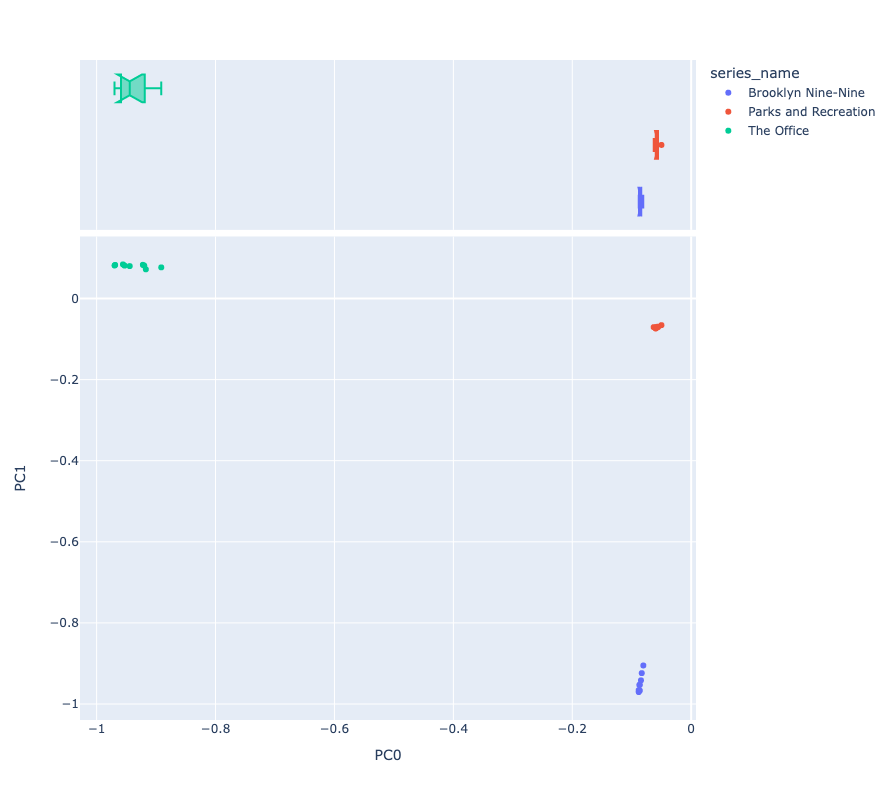

In [41]:
vis_pcs(DCM, 0, 1, label = 'series_name')

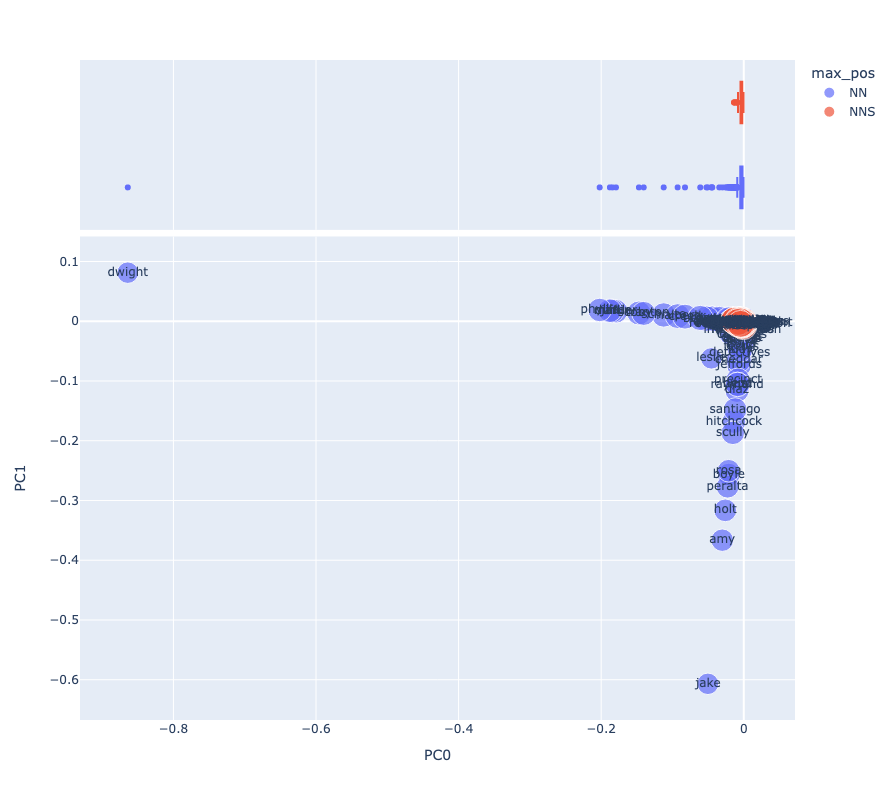

In [42]:
vis_loadings(LOADINGS, 0, 1)

#### 4.3 Topic Modeling

In [7]:
# Parameters for the topic model

ngram_range = [1,2]
n_terms = 4000 # max features for the count vectorizer
n_topics = 20 # number of components for LDA
max_iter = 5 # max iter for LDA
n_top_terms = 7 # number of words used to characterize a topic

In [5]:
def generate_topic_model(BAG, TOKENS):
    # filter for nouns
    DOCS = TOKENS[TOKENS.pos.isin(['NN', 'NNS'])]\
        .groupby(BAG).term_str\
        .apply(lambda x: ' '.join(x))\
        .to_frame()\
        .rename(columns={'term_str':'doc_str'})
    
    # create vector space
    
    count_engine = CountVectorizer(max_features=n_terms, ngram_range=ngram_range, stop_words='english')
    count_model = count_engine.fit_transform(DOCS.doc_str)
    TERMS = count_engine.get_feature_names_out()
    
    VOCAB = pd.DataFrame(index=TERMS)
    VOCAB.index.name = 'term_str'
    
    DTM = pd.DataFrame(count_model.toarray(), index=DOCS.index, columns=TERMS)
    
    VOCAB['doc_count'] = DTM.astype('bool').astype('int').sum()
    DOCS['term_count'] = DTM.sum(1)
    
    # generate model
    
    lda_engine = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)
    
    TNAMES = [f"T{str(x).zfill(len(str(n_topics)))}" for x in range(n_topics)]
    
    # THETA
    
    lda_model = lda_engine.fit_transform(count_model)
    
    THETA = pd.DataFrame(lda_model, index=DOCS.index)
    THETA.columns.name = 'topic_id'
    THETA.columns = TNAMES
    
    # PHI
    
    PHI = pd.DataFrame(lda_engine.components_, columns=TERMS, index=TNAMES)
    PHI.index.name = 'topic_id'
    PHI.columns.name  = 'term_str'
    
    # TOPICS
    
    TOPICS = PHI.stack().to_frame('topic_weight').groupby('topic_id')\
        .apply(lambda x: x.sort_values('topic_weight', ascending=False)\
        .head(n_top_terms).reset_index().drop('topic_id', axis=1)['term_str'])
    
    TOPICS['label'] = TOPICS.apply(lambda x: x.name + ' ' + ', '.join(x[:n_top_terms]), 1)
    
    # sort topics by doc weight
    
    TOPICS['doc_weight_sum'] = THETA.sum()
    TOPICS['term_freq'] = PHI.sum(1) / PHI.sum(1).sum()
    
    return THETA, PHI, TOPICS

In [15]:
THETA_SCENES, PHI_SCENES, TOPICS_SCENES = generate_topic_model(EPISODES, CORPUS)

In [16]:
THETA_SCENES.sample(20).style.background_gradient(cmap=colors, axis=None)

In [17]:
TOPICS_SCENES.sort_values(by = 'term_freq', ascending = False).head(20)

term_str,0,1,2,3,4,5,6,label,doc_weight_sum,term_freq
topic_id,,,,,,,,,,
T00,im,okay,dont,yeah,oh,right,hey,"T00 im, okay, dont, yeah, oh, right, hey",137.342897,0.268807
T05,im,oh,youre,right,dont,thats,yeah,"T05 im, oh, youre, right, dont, thats, yeah",89.536076,0.212921
T09,im,okay,dont,oh,yeah,youre,right,"T09 im, okay, dont, oh, yeah, youre, right",66.114225,0.145173
T16,im,oh,dont,youre,ron,okay,gonna,"T16 im, oh, dont, youre, ron, okay, gonna",37.339921,0.082712
T01,im,oh,dont,okay,right,youre,gonna,"T01 im, oh, dont, okay, right, youre, gonna",25.844707,0.069147
T02,im,oh,dont,okay,right,gonna,youre,"T02 im, oh, dont, okay, right, gonna, youre",25.829060,0.066481
T18,im,oh,dont,okay,right,yeah,youre,"T18 im, oh, dont, okay, right, yeah, youre",17.434017,0.041378
T06,im,oh,youre,dont,thats,okay,yeah,"T06 im, oh, youre, dont, thats, okay, yeah",9.694111,0.024090
T17,dont,okay,im,oh,right,michael,think,"T17 dont, okay, im, oh, right, michael, think",11.293870,0.024041


In [18]:
CORPUS[CORPUS['term_str'] == 'and']

Unnamed: 0       pos_tuple pos  \
series_id   season_id episode_id scene_id                                   
parksandrec 1         1          1                  7   ('and', 'CC')  CC   
                                 1                 13   ('and', 'CC')  CC   
                                 1                 31   ('and', 'CC')  CC   
                                 1                 40  ('"and', 'NN')  NN   
                                 1                 48   ('and', 'CC')  CC   
...                                               ...             ...  ..   
theoffice   9         23         15            564355   ('and', 'CC')  CC   
                                 15            564362   ('and', 'CC')  CC   
                                 15            564514   ('and', 'CC')  CC   
                                 15            564527   ('and', 'CC')  CC   
                                 15            564553   ('and', 'CC')  CC   

                                          token_str term_str  
series_id   season_id episode_id scene_id                     
parksandrec 1         1          1              and      and  
                                 1              and      and  
                                 1              and      and  
                                 1             "and      and  
                                 1              and      and  
...                                             ...      ...  
theoffice   9         23         15             and      and  
                                 15             and      and  
                                 15             and      and  
                                 15             and      and  
                                 15             and      and  

[25892 rows x 5 columns]

#### 4.4 Word Embeddings

In [12]:
CORPUS_PNR = CORPUS.copy()
CORPUS_PNR = CORPUS_PNR[CORPUS_PNR.index.isin(['parksandrec'], level = 'series_id')]
CORPUS_PNR = CORPUS_PNR[CORPUS_PNR.pos.isin(['NN', 'NNS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ'])]

In [13]:
CORPUS_PNR

Unnamed: 0               pos_tuple  \
series_id   season_id episode_id scene_id                                       
parksandrec 1         1          1                  0        ('Hello.', 'NN')   
                                 1                  1           ('Hi.', 'NN')   
                                 1                  3          ('name', 'NN')   
                                 1                  4           ('is', 'VBZ')   
                                 1                  9          ('work', 'NN')   
...                                               ...                     ...   
            7         12         15            436864           ('is', 'VBZ')   
                                 15            436866        ('series', 'NN')   
                                 15            436867          ('wrap', 'NN')   
                                 15            436869       ('"Parks', 'NNS')   
                                 15            436871  ('Recreation."', 'NN')   

                                           pos     token_str    term_str  
series_id   season_id episode_id scene_id                                 
parksandrec 1         1          1          NN        Hello.       hello  
                                 1          NN           Hi.          hi  
                                 1          NN          name        name  
                                 1         VBZ            is          is  
                                 1          NN          work        work  
...                                        ...           ...         ...  
            7         12         15        VBZ            is          is  
                                 15         NN        series      series  
                                 15         NN          wrap        wrap  
                                 15        NNS        "Parks       parks  
                                 15         NN  Recreation."  recreation  

[245303 rows x 5 columns]

In [14]:
# Extract VOCAB PNR
VOCAB_PNR = CORPUS_PNR.term_str.value_counts().to_frame('n').sort_index()
VOCAB_PNR.index.name = 'term_str'

# Get the most frequently associated part-of-space category for each word.
VOCAB_PNR['max_pos'] = CORPUS_PNR[['term_str','pos']].value_counts().unstack(fill_value=0).idxmax(1)
VOCAB_PNR['pos_group'] = VOCAB_PNR['max_pos'].apply(lambda x: x[:2])

In [18]:
VOCAB_PNR.sort_values('n', ascending = False)

,n,max_pos,pos_group
term_str,,,
is,5626,VBZ,VB
im,3645,NN,NN
have,3064,VB,VB
its,2656,NN,NN
are,2639,VBP,VB
...,...,...,...
prejudice,1,NN,NN
expire,1,NN,NN
pregnancies,1,NNS,NN


In [19]:
# word2vec parameters
w2v_params_pnr = dict(
    window = 2,
    vector_size = 256,
    min_count = 50,
    workers = 4
)


In [20]:
DOCS_PNR = CORPUS_PNR\
    .groupby(SCENES)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()
DOCS_PNR = [doc for doc in DOCS_PNR if len(doc) > 1] # Lose single word docs

In [21]:
model_pnr = word2vec.Word2Vec(DOCS_PNR, **w2v_params_pnr)

In [22]:
coords_pnr = pd.DataFrame(
    dict(
        vector = [model_pnr.wv.get_vector(w) for w in model_pnr.wv.key_to_index], 
        term_str = model_pnr.wv.key_to_index.keys()
    )).set_index('term_str')

In [23]:
coords_pnr

,vector
term_str,
is,"[0.062986016, -0.022755824, 0.16220838, 0.0285..."
im,"[-0.021547044, -0.092295475, 0.007794216, 0.04..."
have,"[0.06161606, -0.013459158, 0.11578417, 0.04366..."
its,"[0.14484708, -0.15008646, 0.18688402, 0.095916..."
are,"[-0.067182615, -0.12802456, 0.01981444, 0.0625..."
...,...
mother,"[0.06328831, -0.12002247, 0.09765923, 0.071039..."
handle,"[0.06487596, -0.102876976, 0.074301004, 0.0832..."
decided,"[0.04342766, -0.08813997, 0.08607961, 0.033809..."


In [24]:
tsne_engine_pnr = TSNE(
    learning_rate=200,
    perplexity=20, 
    n_components=2, 
    init='random', 
    n_iter=1000, 
    random_state=42
)
vectors_pnr = np.array(coords_pnr.vector.to_list())
tsne_model_pnr = tsne_engine_pnr.fit_transform(vectors_pnr)

In [25]:
coords_pnr['x'] = tsne_model_pnr[:,0]
coords_pnr['y'] = tsne_model_pnr[:,1]

if coords_pnr.shape[1] == 3:
    coords_pnr = coords_pnr.merge(VOCAB_PNR.reset_index(), on='term_str')
    coords_pnr = coords_pnr.set_index('term_str')

In [26]:
coords_pnr.head()

,vector,x,y,n,max_pos,pos_group
term_str,,,,,,
is,"[0.062986016, -0.022755824, 0.16220838, 0.0285...",-38.179585,-13.300718,5626,VBZ,VB
im,"[-0.021547044, -0.092295475, 0.007794216, 0.04...",34.299801,-24.313606,3645,NN,NN
have,"[0.06161606, -0.013459158, 0.11578417, 0.04366...",-45.132351,14.901770,3064,VB,VB
its,"[0.14484708, -0.15008646, 0.18688402, 0.095916...",23.694529,-22.043287,2656,NN,NN
are,"[-0.067182615, -0.12802456, 0.01981444, 0.0625...",34.068474,-22.776424,2639,VBP,VB


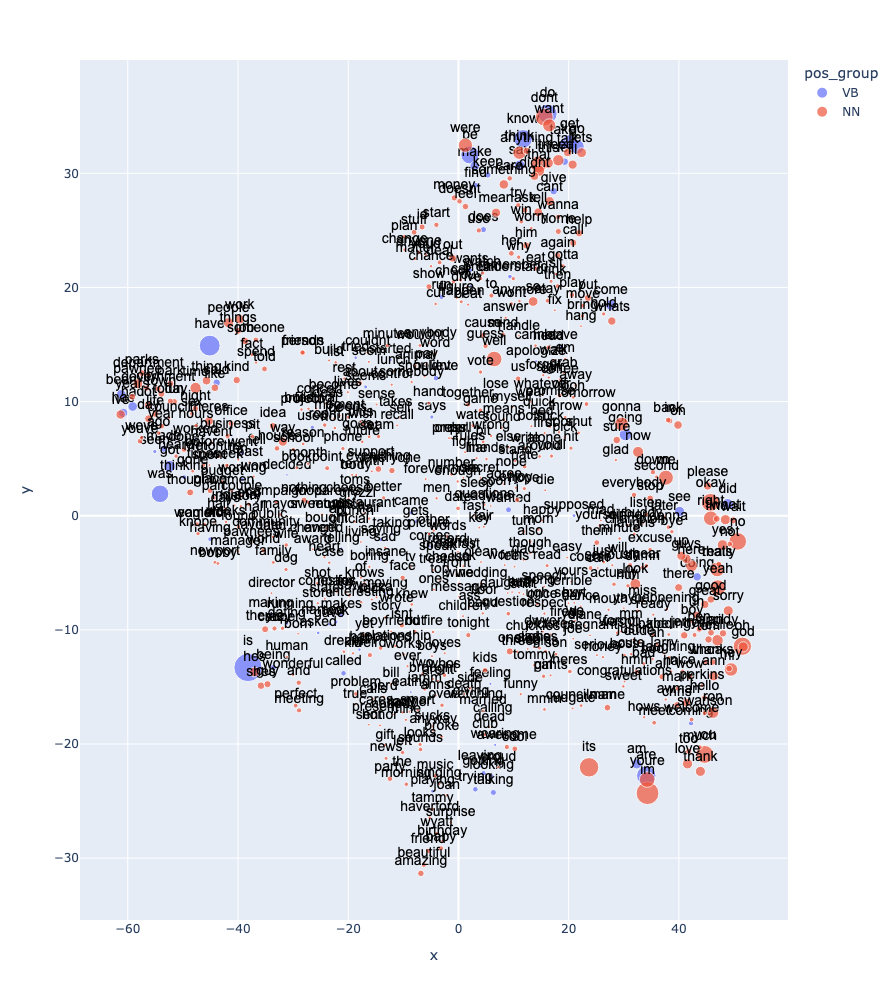

In [27]:
px.scatter(coords_pnr.reset_index(), 'x', 'y', 
           text='term_str', 
           color='pos_group', 
           hover_name='term_str',          
           size='n',
           height=1000).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

#### 4.5 Sentiment Analysis

In [28]:
CORPUS_PNR

Unnamed: 0               pos_tuple  \
series_id   season_id episode_id scene_id                                       
parksandrec 1         1          1                  0        ('Hello.', 'NN')   
                                 1                  1           ('Hi.', 'NN')   
                                 1                  3          ('name', 'NN')   
                                 1                  4           ('is', 'VBZ')   
                                 1                  9          ('work', 'NN')   
...                                               ...                     ...   
            7         12         15            436864           ('is', 'VBZ')   
                                 15            436866        ('series', 'NN')   
                                 15            436867          ('wrap', 'NN')   
                                 15            436869       ('"Parks', 'NNS')   
                                 15            436871  ('Recreation."', 'NN')   

                                           pos     token_str    term_str  
series_id   season_id episode_id scene_id                                 
parksandrec 1         1          1          NN        Hello.       hello  
                                 1          NN           Hi.          hi  
                                 1          NN          name        name  
                                 1         VBZ            is          is  
                                 1          NN          work        work  
...                                        ...           ...         ...  
            7         12         15        VBZ            is          is  
                                 15         NN        series      series  
                                 15         NN          wrap        wrap  
                                 15        NNS        "Parks       parks  
                                 15         NN  Recreation."  recreation  

[245303 rows x 5 columns]

In [29]:
ce = CorpusEnhancer(CORPUS_PNR, SCENES)
VOCAB_PNR = ce.generate_enhanced_vocab(SCENES)

Using TF method: sum


In [64]:
VOCAB_PNR[VOCAB_PNR['stop'] == 1]

,n,n_chars,p,i,h,max_pos,n_pos,cat_pos,stop,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max,dfidf
term_str,,,,,,,,,,,,,,
a,53,1,0.000216,12.176285,0.002631,NN,2,"{NN, VBP}",1,0.048842,2.197912,0.041764,0.188232,240.559868
about,154,5,0.000628,10.637419,0.006678,NN,1,{NN},1,0.030014,4.171944,0.028387,0.064673,516.897474
above,2,5,0.000008,16.904205,0.000138,NN,2,"{NN, VB}",1,0.076754,0.153508,0.076754,0.080636,19.675256
after,7,5,0.000029,15.096850,0.000431,NN,1,{NN},1,0.063034,0.441237,0.061300,0.072345,56.211911
again,267,5,0.001088,9.843509,0.010714,NN,1,{NN},1,0.027424,6.033311,0.023510,0.109152,672.379008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
you,2253,3,0.009185,6.766574,0.062148,NN,1,{NN},1,0.008427,10.120410,0.007321,0.032971,729.736604
your,14,4,0.000057,14.096850,0.000805,NN,1,{NN},1,0.048684,0.681577,0.050947,0.063336,98.423822
yours,50,5,0.000204,12.260349,0.002499,NN,2,"{NNS, NN}",1,0.038214,1.872491,0.038688,0.091630,255.922986


In [31]:
BOW_PNR = ce.BOW
BOW_PNR

n     tfidf
series_id   season_id episode_id scene_id term_str             
parksandrec 1         1          1        allowed   1  0.049247
                                          amount    1  0.051341
                                          and       1  0.030384
                                          anymore   1  0.040319
                                          are       3  0.012072
...                                                ..       ...
            7         12         15       yay       1  0.019855
                                          yeah      4  0.012677
                                          years     1  0.010022
                                          yes       1  0.005908
                                          youre     1  0.003190

[188146 rows x 2 columns]

In [32]:
SALEX = pd.read_csv('salex_nrc.csv').set_index('term_str')
SALEX.columns = [col.replace('nrc_','') for col in SALEX.columns]
SALEX

,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,sentiment
term_str,,,,,,,,,,,
abandon,0,0,0,1,0,1,0,1,0,0,-1
abandoned,1,0,0,1,0,1,0,1,0,0,-1
abandonment,1,0,0,1,0,1,0,1,1,0,-1
abduction,0,0,0,1,0,1,0,1,1,0,-1
aberration,0,0,1,0,0,1,0,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...
young,0,1,0,0,1,0,1,0,1,0,1
youth,1,1,0,1,1,0,1,0,1,0,1
zeal,0,1,0,0,1,0,1,0,1,1,1


In [34]:
V = pd.concat([VOCAB_PNR.reset_index().set_index('term_str'), SALEX], join='inner', axis=1) #\
    # .reset_index().set_index('term_id')
V

,n,n_chars,p,i,h,max_pos,n_pos,cat_pos,stop,tfidf_mean,...,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,sentiment
term_str,,,,,,,,,,,,,,,,,,,,,
abandon,1,7,0.000004,17.904205,0.000073,NN,1,{NN},0,0.082103,...,0,0,1,0,1,0,1,0,0,-1
abandoned,11,9,0.000045,14.444774,0.000648,VBN,2,"{NN, VBN}",0,0.052328,...,0,0,1,0,1,0,1,0,0,-1
abhorrent,1,9,0.000004,17.904205,0.000073,NN,1,{NN},0,0.089567,...,0,1,1,0,1,0,0,0,0,-1
abortion,1,8,0.000004,17.904205,0.000073,NN,1,{NN},0,0.081486,...,0,1,1,0,1,0,1,0,0,-1
absence,2,7,0.000008,16.904205,0.000138,NN,1,{NN},0,0.069500,...,0,0,1,0,1,0,1,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yell,11,4,0.000045,14.444774,0.000648,NN,1,{NN},0,0.054161,...,0,0,1,0,1,0,0,1,0,-1
yelp,4,4,0.000016,15.904205,0.000259,NN,1,{NN},0,0.077194,...,0,0,1,0,1,0,0,1,0,-1
young,17,5,0.000069,13.816743,0.000958,NN,1,{NN},0,0.053769,...,1,0,0,1,0,1,0,1,0,1


In [36]:
emo_cols = "anger anticipation disgust fear joy sadness surprise trust sentiment".split()
B = BOW_PNR.join(V[['max_pos'] + emo_cols], on='term_str', rsuffix='_v').dropna()
B

n     tfidf max_pos  \
series_id   season_id episode_id scene_id term_str                          
parksandrec 1         1          1        enjoying    2  0.129512     VBG   
                                          fun         4  0.101951      NN   
                                          government  4  0.111061      NN   
                                          recreation  1  0.055302      NN   
                                          sir         1  0.040319      NN   
...                                                  ..       ...     ...   
            7         12         15       sir         1  0.016361      NN   
                                          smile       1  0.025472      NN   
                                          thrilling   1  0.033524      NN   
                                          toast       1  0.025111      NN   
                                          vampire     1  0.035644      NN   

                                                      anger  anticipation  \
series_id   season_id episode_id scene_id term_str                          
parksandrec 1         1          1        enjoying      0.0           1.0   
                                          fun           0.0           1.0   
                                          government    0.0           0.0   
                                          recreation    0.0           1.0   
                                          sir           0.0           0.0   
...                                                     ...           ...   
            7         12         15       sir           0.0           0.0   
                                          smile         0.0           0.0   
                                          thrilling     0.0           1.0   
                                          toast         0.0           0.0   
                                          vampire       1.0           0.0   

                                                      disgust  fear  joy  \
series_id   season_id episode_id scene_id term_str                         
parksandrec 1         1          1        enjoying        0.0   0.0  1.0   
                                          fun             0.0   0.0  1.0   
                                          government      0.0   1.0  0.0   
                                          recreation      0.0   0.0  1.0   
                                          sir             0.0   0.0  0.0   
...                                                       ...   ...  ...   
            7         12         15       sir             0.0   0.0  0.0   
                                          smile           0.0   0.0  1.0   
                                          thrilling       0.0   0.0  1.0   
                                          toast           0.0   0.0  1.0   
                                          vampire         1.0   1.0  0.0   

                                                      sadness  surprise  \
series_id   season_id episode_id scene_id term_str                        
parksandrec 1         1          1        enjoying        0.0       0.0   
                                          fun             0.0       0.0   
                                          government      0.0       0.0   
                                          recreation      0.0       0.0   
                                          sir             0.0       0.0   
...                                                       ...       ...   
            7         12         15       sir             0.0       0.0   
                                          smile           0.0       1.0   
                                          thrilling       0.0       1.0   
                                          toast           0.0       0.0   
                                          vampire         0.0       0.0   

                                                      trust  sentiment  
series_id   

In [37]:
for col in emo_cols:
    B[col] = B[col] * B.tfidf

B.head()

n     tfidf max_pos  \
series_id   season_id episode_id scene_id term_str                          
parksandrec 1         1          1        enjoying    2  0.129512     VBG   
                                          fun         4  0.101951      NN   
                                          government  4  0.111061      NN   
                                          recreation  1  0.055302      NN   
                                          sir         1  0.040319      NN   

                                                      anger  anticipation  \
series_id   season_id episode_id scene_id term_str                          
parksandrec 1         1          1        enjoying      0.0      0.129512   
                                          fun           0.0      0.101951   
                                          government    0.0      0.000000   
                                          recreation    0.0      0.055302   
                                          sir           0.0      0.000000   

                                                      disgust      fear  \
series_id   season_id episode_id scene_id term_str                        
parksandrec 1         1          1        enjoying        0.0  0.000000   
                                          fun             0.0  0.000000   
                                          government      0.0  0.111061   
                                          recreation      0.0  0.000000   
                                          sir             0.0  0.000000   

                                                           joy  sadness  \
series_id   season_id episode_id scene_id term_str                        
parksandrec 1         1          1        enjoying    0.129512      0.0   
                                          fun         0.101951      0.0   
                                          government  0.000000      0.0   
                                          recreation  0.055302      0.0   
                                          sir         0.000000      0.0   

                                                      surprise     trust  \
series_id   season_id episode_id scene_id term_str                         
parksandrec 1         1          1        enjoying         0.0  0.129512   
                                          fun              0.0  0.000000   
                                          government       0.0  0.000000   
                                          recreation       0.0  0.000000   
                                          sir              0.0  0.040319   

                                                      sentiment  
series_id   season_id episode_id scene_id term_str               
parksandrec 1         1          1        enjoying     0.129512  
                                          fun          0.101951  
                                          government  -0.111061  
                                          recreation   0.055302  
                                          sir          0.040319

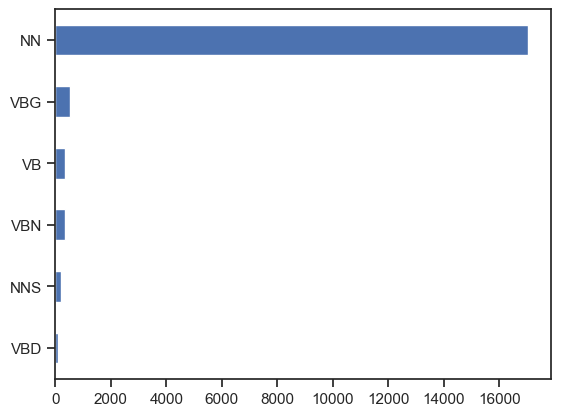

In [38]:
B.max_pos.value_counts().sort_values().plot.barh();

In [39]:
EMO_SEASONS = B.groupby(['series_id', 'season_id'])[emo_cols].mean()
EMO_EPS = B.groupby(['series_id', 'season_id', 'episode_id'])[emo_cols].mean()

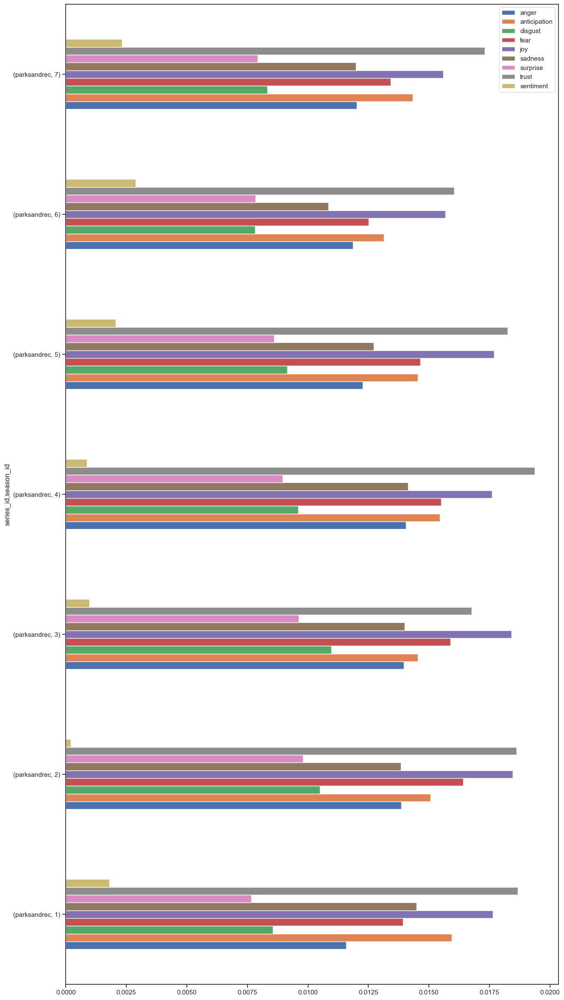

In [41]:
EMO_SEASONS.plot.barh(figsize=(15,30));

In [42]:
trust_words = pd.Series(SALEX[SALEX['trust'] == 1].index.tolist())
trust_words.sample(20)

35          allied
834       symmetry
481       instruct
912         warden
572          money
243      deference
558       mediator
374         friend
452      husbandry
927           word
642           pill
441        honesty
577         mother
843         tender
455     immaculate
575       morality
913           warn
902    vindication
545     management
719       relevant
dtype: object

In [43]:
PNR_eps = EMO_EPS
PNR_eps.style.background_gradient(cmap='YlGnBu', axis=None)

In [49]:
PNR_eps_thin = EMO_EPS.stack().to_frame().reset_index().rename(columns={0:'value','level_3':'emo'})#.query("book_id == {}".format(persuasion))

In [50]:
PNR_eps_thin

,series_id,season_id,episode_id,emo,value
0,parksandrec,1,1,anger,0.011103
1,parksandrec,1,1,anticipation,0.021173
2,parksandrec,1,1,disgust,0.004155
3,parksandrec,1,1,fear,0.018318
4,parksandrec,1,1,joy,0.019574
...,...,...,...,...,...
1093,parksandrec,7,12,joy,0.009557
1094,parksandrec,7,12,sadness,0.004880
1095,parksandrec,7,12,surprise,0.003660
1096,parksandrec,7,12,trust,0.008990


In [54]:
PNR_seasons_thin = EMO_SEASONS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'})#.query("book_id == {}".format(persuasion))

In [55]:
PNR_seasons_thin

,series_id,season_id,emo,value
0,parksandrec,1,anger,0.011582
1,parksandrec,1,anticipation,0.015934
2,parksandrec,1,disgust,0.008549
3,parksandrec,1,fear,0.013928
4,parksandrec,1,joy,0.017648
...,...,...,...,...
58,parksandrec,7,joy,0.015584
59,parksandrec,7,sadness,0.011994
60,parksandrec,7,surprise,0.007922
61,parksandrec,7,trust,0.017303


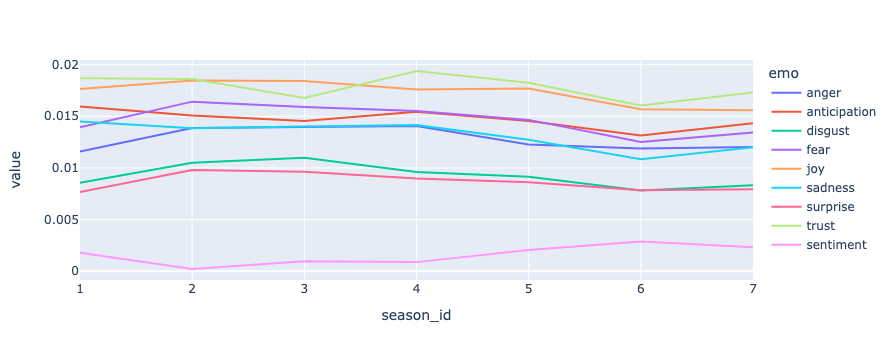

In [56]:
px.line(PNR_seasons_thin, x='season_id', y='value', color='emo')

In [45]:
def plot_sentiments(df, emo='sentiment'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
    df[emo].plot(**FIG)

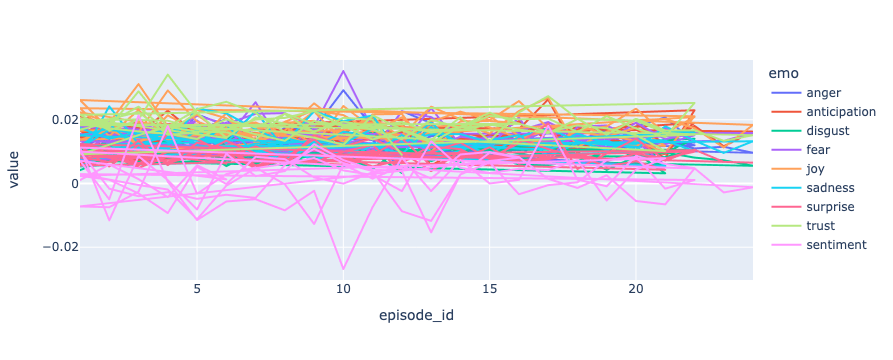

In [51]:
px.line(PNR_eps_thin, x='episode_id', y='value', color='emo')

In [58]:
T = CORPUS_PNR.join(V, on='term_str').fillna(0)

In [59]:
T

Unnamed: 0               pos_tuple  \
series_id   season_id episode_id scene_id                                       
parksandrec 1         1          1                  0        ('Hello.', 'NN')   
                                 1                  1           ('Hi.', 'NN')   
                                 1                  3          ('name', 'NN')   
                                 1                  4           ('is', 'VBZ')   
                                 1                  9          ('work', 'NN')   
...                                               ...                     ...   
            7         12         15            436864           ('is', 'VBZ')   
                                 15            436866        ('series', 'NN')   
                                 15            436867          ('wrap', 'NN')   
                                 15            436869       ('"Parks', 'NNS')   
                                 15            436871  ('Recreation."', 'NN')   

                                           pos     token_str    term_str  \
series_id   season_id episode_id scene_id                                  
parksandrec 1         1          1          NN        Hello.       hello   
                                 1          NN           Hi.          hi   
                                 1          NN          name        name   
                                 1         VBZ            is          is   
                                 1          NN          work        work   
...                                        ...           ...         ...   
            7         12         15        VBZ            is          is   
                                 15         NN        series      series   
                                 15         NN          wrap        wrap   
                                 15        NNS        "Parks       parks   
                                 15         NN  Recreation."  recreation   

                                              n  n_chars         p          i  \
series_id   season_id episode_id scene_id                                       
parksandrec 1         1          1          0.0      0.0  0.000000   0.000000   
                                 1          0.0      0.0  0.000000   0.000000   
                                 1          0.0      0.0  0.000000   0.000000   
                                 1          0.0      0.0  0.000000   0.000000   
                                 1          0.0      0.0  0.000000   0.000000   
...                                         ...      ...       ...        ...   
            7         12         15         0.0      0.0  0.000000   0.000000   
                                 15         0.0      0.0  0.000000   0.000000   
                                 15         0.0      0.0  0.000000   0.000000   
                                 15         0.0      0.0  0.000000   0.000000   
                                 15        29.0     10.0  0.000118  13.046224   

                                                  h  ... anticipation  \
series_id   season_id episode_id scene_id            ...                
parksandrec 1         1          1         0.000000  ...          0.0   
                                 1         0.000000  ...          0.0   
                                 1         0.000000  ...          0.0   
                                 1         0.000000  ...          0.0   
                                 1         0.000000  ...          0.0   
...                                             ...  ...          ...   
            7         12         15        0.000000  ...          0.0   
                                 15        0.000000  ...          0.0   
                                 15        0.000000  ...          0.0   
                                 15        0.000000  ...          0.0   
                                 15        0.001542  ...          1.0 

In [60]:
PNR_2 = T.copy()

In [61]:
emo = 'sentiment'
PNR_2['html'] = PNR_2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)

In [62]:
PNR_lines = PNR_2.groupby(LINES[1:])[emo_cols].mean()

KeyError: 'line_id'

### 4.2 Heatmaps showing correlations

### 4.3 Scatter plots

### 4.4 KDE plots

### 4.5 Dispersion plots

### 4.6 t-SNE plots

## 5. Interpretation
Provide your interpretation of the results of exploration, and any conclusion if you are comfortable making them.